# Test holoview library for interactive plot of the EEL sections


**Things left to do:**
- [x] Create another object to extract where there is an extra button to switch between mean and std field.
- [x] Add a third or fourth field for statistics (number of profiles and standard error)
- [ ] Create a separate notebook for the gridded section (gridmeansta and velgrid1) in order to use also the plotting function Image

Here interactive plot are made from the original EEL section. 

Interactive plots (mean, std and SE sections), after regridding the sections on a regular spatial grid, are shown in the notebook [02-lh-holoview_2_gridded_section.ipynb](02-lh-holoview_2_gridded_section.ipynb)

___

### Import libraries

In [1]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

#plt.style.use('dark_background')

%matplotlib inline


#### Variables

In [2]:
pathdir = '../../data/raw/csv_ctdgrid'
colsec = 'royalblue'
colvec = 'salmon'
colellipse = 'limegreen'

## 1. Load and Prep. data

### 1.1 Load data into DataFrame

In [3]:
file4 = pathdir+'/'+'EELCTDandLADCP_3Dfield.csv'
dflad = pd.read_csv(file4,sep=',', index_col=None, 
                     header=0).drop(columns=['Vladcpalong'])


#### 1.1.1 Sort data format and variable name

In [4]:
dflad=dflad.round({'PMTP': 4, 'PSAL': 3, 'Sigma0': 3, 'Vrel': 3, 'Vladcp': 3, 'Vabs': 3})
dflad['Refdist']=dflad['Refdist'].apply(int)
dflad.head()

,CruiseID,Year,Staname,Refdist,Depth,PTMP,PSAL,Sigma0,Vrel,Vladcp,Vabs
0,d22396,1996,14G,1180,25,13.111862,35.194,26.521,0.071,-0.013,0.055
1,d22396,1996,14G,1180,35,13.084566,35.192,26.525,0.070,0.006,0.055
2,d22396,1996,14G,1180,45,12.935832,35.184,26.547,0.071,0.011,0.055
3,d22396,1996,14G,1180,55,12.398809,35.189,26.655,0.070,0.031,0.054
4,d22396,1996,14G,1180,65,11.861810,35.195,26.764,0.064,0.067,0.048


In [5]:
df3D = dflad.rename(columns={"Refdist": "refdist","Year": "year","Depth": "depth"}).set_index(['refdist','year','depth']).round(3).sort_values(['refdist','year','depth']).drop(columns=['CruiseID','Staname'])
df3D=df3D.rename(columns={"PTMP": "ptmp", "PSAL": "psal", "Sigma0": "sigma0"})
df3D.head()

ptmp    psal  sigma0   Vrel  Vladcp   Vabs
refdist year depth                                             
13      2005 15     8.815  35.020  27.163 -0.005   0.107  0.065
             25     8.827  35.041  27.178 -0.000   0.101  0.070
             35     8.783  35.073  27.210  0.003   0.086  0.073
             45     8.736  35.080  27.222  0.006   0.068  0.076
             55     8.733  35.098  27.237  0.008   0.055  0.078

#### 1.1.2 Import additional metadata

In [6]:
# Location of EEL stations
file3 = pathdir+'/'+'EELCTDandLADCP_refpos.csv'
dfloc = pd.read_csv(file3,sep=',', index_col=None, 
                     header=0)
dfloc['Refdist'] = dfloc['Refdist'].round(decimals=1)

# Sorted according to distance:
dfs = dfloc.sort_values('Refdist', ascending=True)
dfs.sample(5)

,Staname,Refdist,LonSta,LatSta,DepthSta
57,IB13A,299.0,-20.000,60.750,2500
31,E,897.8,-12.633,57.533,1650
36,IB1,819.5,-13.900,57.667,150
21,O,1080.5,-9.700,57.150,1900
9,10G,1222.6,-7.500,56.733,215



## 1.2 Convert 3D dataframe into Xarray DataSet

In [7]:
da0 = df3D.to_xarray()
print(da0)

<xarray.Dataset>
Dimensions:  (depth: 269, refdist: 59, year: 15)
Coordinates:
  * refdist  (refdist) int64 13 25 55 84 122 160 ... 1180 1191 1222 1232 1242
  * year     (year) int64 1996 1997 1998 1999 2000 ... 2013 2014 2015 2016 2017
  * depth    (depth) int64 5 15 25 35 45 55 65 ... 2635 2645 2655 2665 2675 2685
Data variables:
    ptmp     (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    psal     (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    sigma0   (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    Vrel     (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    Vladcp   (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    Vabs     (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan



#### 1.2.1 Add additional Variables from metadatafile (Lat,Lon, Station Name, Cruise ID)

In [8]:
# Get position metadata

dfloc = pd.read_csv(pathdir+'/'+'EELCTDandLADCP_refpos.csv',sep=',', index_col=None, 
                     header=0)
# Make sure the station name are sorted by their distance along the section
sdfloc = dfloc.rename(columns={"Refdist": "refdist"}).sort_values('refdist', ascending=True)
sdfloc['refdist']=sdfloc['refdist'].apply(int)
sdfloc=sdfloc.set_index('refdist')

daloc = sdfloc.to_xarray()
print(daloc)

<xarray.Dataset>
Dimensions:   (refdist: 69)
Coordinates:
  * refdist   (refdist) int64 0 13 25 55 84 122 ... 1277 1286 1292 1298 1307
Data variables:
    Staname   (refdist) object 'IB23S' 'IB22S' 'IB21S' ... '3G' '2G' '1G'
    LonSta    (refdist) float64 -20.21 -20.07 -19.92 ... -6.367 -6.283 -6.133
    LatSta    (refdist) float64 63.32 63.22 63.13 62.92 ... 56.71 56.68 56.67
    DepthSta  (refdist) int64 120 670 1030 1400 1670 1790 ... 80 115 70 30 190


In [9]:
# Get cruise (time) metadata
dfdate = pd.read_csv(pathdir+'/'+'EELCTDandLADCP_refdate.csv',sep=',', index_col=None, 
                     header=0).rename(columns={"Year": "year"}).set_index('year')
dadate = dfdate.to_xarray()
print(dadate)

<xarray.Dataset>
Dimensions:   (year: 17)
Coordinates:
  * year      (year) int64 1996 1997 1998 1999 2000 ... 2013 2014 2015 2016 2017
Data variables:
    CruiseID  (year) object 'd22396' 'd23097' 'd23398' ... 'dy052' 'dy078'
    Month     (year) int64 10 9 5 9 2 2 10 10 8 6 5 5 5 7 6 6 5



#### 1.2.2 Merge metadata into main Dataset 

In [10]:
da=xr.merge([da0, daloc,dadate])
print(da)

<xarray.Dataset>
Dimensions:   (depth: 269, refdist: 69, year: 17)
Coordinates:
  * refdist   (refdist) int64 0 13 25 55 84 122 ... 1277 1286 1292 1298 1307
  * year      (year) int64 1996 1997 1998 1999 2000 ... 2013 2014 2015 2016 2017
  * depth     (depth) int64 5 15 25 35 45 55 ... 2635 2645 2655 2665 2675 2685
Data variables:
    ptmp      (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    psal      (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    sigma0    (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    Vrel      (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    Vladcp    (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    Vabs      (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    Staname   (refdist) object 'IB23S' 'IB22S' 'IB21S' ... '3G' '2G' '1G'
    LonSta    (refdist) float64 -20.21 -20.07 -19.92 ... -6.367 -6.283 -6.133
    LatSta    (refdist) float


#### 1.2.3 Move variables into coordinates

In [11]:
da.coords['lon'] = ('refdist', da.LonSta)
da.coords['lat'] = ('refdist', da.LatSta)
da.coords['Staname'] = ('refdist', da.Staname)
da = da.drop(['LonSta','LatSta'])
print(da)

<xarray.Dataset>
Dimensions:   (depth: 269, refdist: 69, year: 17)
Coordinates:
  * refdist   (refdist) int64 0 13 25 55 84 122 ... 1277 1286 1292 1298 1307
  * year      (year) int64 1996 1997 1998 1999 2000 ... 2013 2014 2015 2016 2017
  * depth     (depth) int64 5 15 25 35 45 55 ... 2635 2645 2655 2665 2675 2685
    Staname   (refdist) object 'IB23S' 'IB22S' 'IB21S' ... '3G' '2G' '1G'
    lon       (refdist) float64 -20.21 -20.07 -19.92 ... -6.367 -6.283 -6.133
    lat       (refdist) float64 63.32 63.22 63.13 62.92 ... 56.71 56.68 56.67
Data variables:
    ptmp      (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    psal      (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    sigma0    (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    Vrel      (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    Vladcp    (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    Vabs      (refdist, year, de


#### 1.2.4 Visual inspection of the data

Using hvplot.interactive (https://hvplot.holoviz.org/user_guide/Interactive.html)

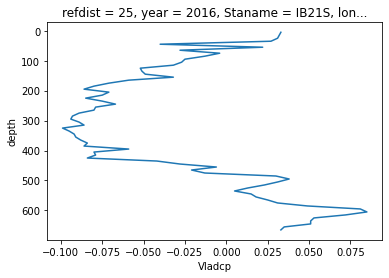

In [12]:
da.Vladcp[2,-2,:].plot(y='depth', yincrease=False)


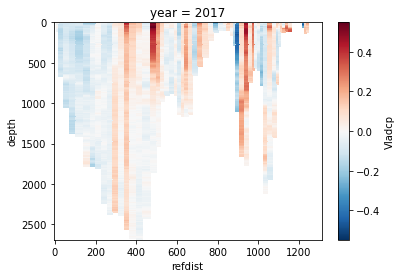

In [13]:
da.Vladcp.sel(year=2017).plot(y='depth', yincrease=False)

In [14]:
import hvplot.xarray # noqa
import hvplot.pandas # noqa
import panel as pn
import panel.widgets as pnw
import ipywidgets as ipw

print(da.Vladcp.interactive.isel.__doc__)

Return a new DataArray whose data is given by integer indexing
        along the specified dimension(s).

        Parameters
        ----------
        indexers : dict, optional
            A dict with keys matching dimensions and values given
            by integers, slice objects or arrays.
            indexer can be a integer, slice, array-like or DataArray.
            If DataArrays are passed as indexers, xarray-style indexing will be
            carried out. See :ref:`indexing` for the details.
            One of indexers or indexers_kwargs must be provided.
        drop : bool, optional
            If ``drop=True``, drop coordinates variables indexed by integers
            instead of making them scalar.
        missing_dims : {"raise", "warn", "ignore"}, default: "raise"
            What to do if dimensions that should be selected from are not present in the
            DataArray:
            - "raise": raise an exception
            - "warning": raise a warning, and ignore the


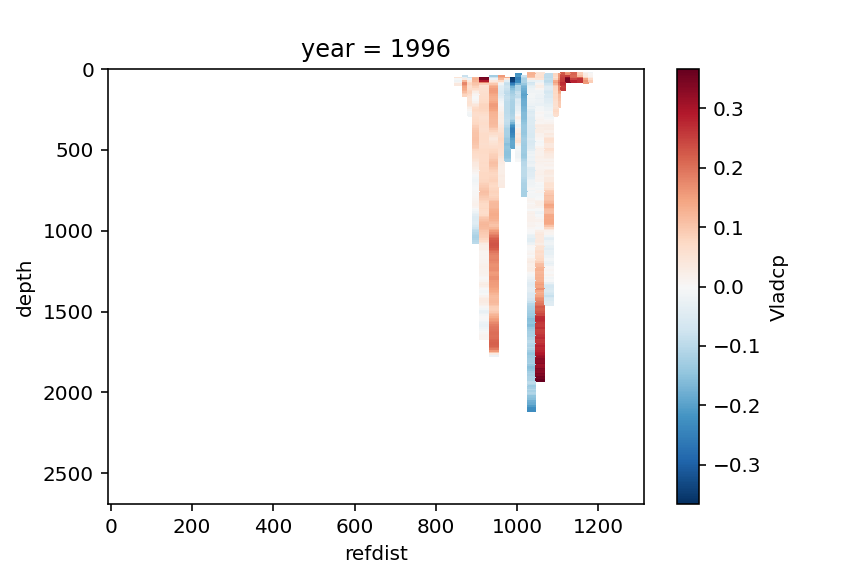

In [15]:
da.Vladcp.interactive.sel(year=pnw.DiscreteSlider).plot(y='depth', yincrease=False)


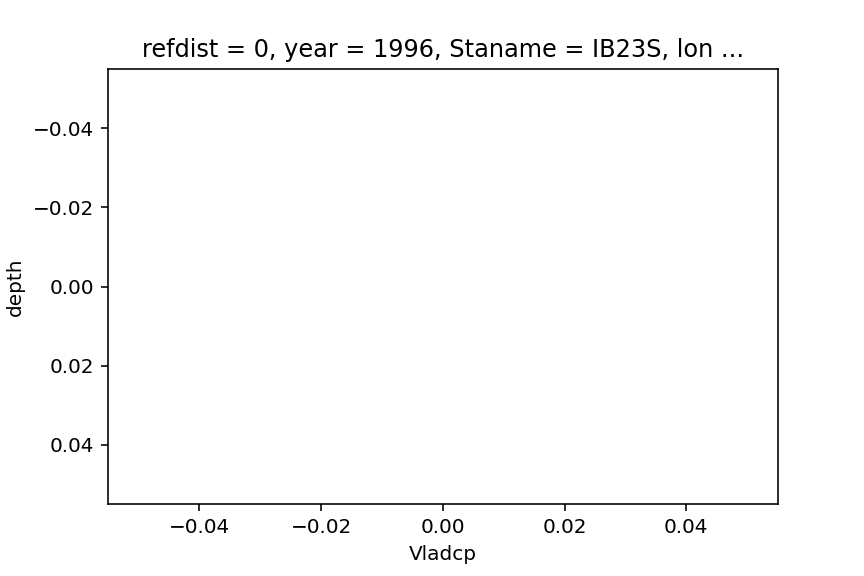

In [16]:

da.Vladcp.interactive.sel(year=pnw.DiscreteSlider,refdist=pnw.DiscreteSlider).plot(y='depth', yincrease=False)

\
Plot evolution of Velocity profile at station E

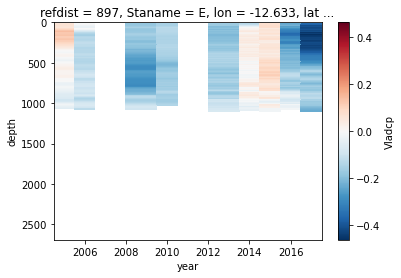

In [17]:
# Extra Refdist value associated with Station E and F
staE = da.refdist.values[da.Staname.values=='E'][0]
staF = da.refdist.values[da.Staname.values=='F'][0]

# Plot 
da.Vladcp.sel(refdist=staE,year=slice('2004','2017')).plot(y='depth', yincrease=False)


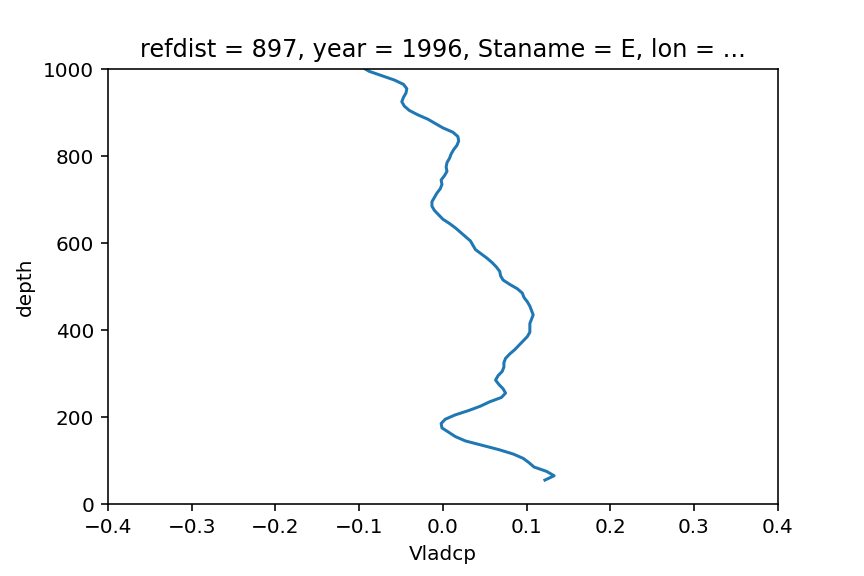

In [18]:
da.Vladcp.interactive.sel(refdist=staE,year=pnw.DiscreteSlider).plot(y='depth',ylim=(0,1000), xlim=(-0.4,0.4), yincrease=False)

In [19]:
Vladcpmean = da.Vladcp.mean('year')
Vladcpstd = da.Vladcp.std(dim='year')

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


\
Plot with data with min and max values

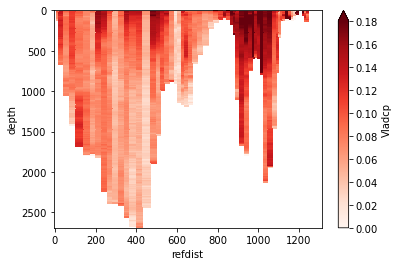

In [20]:
Vladcpstd.plot(y='depth', yincrease=False, vmin=0, vmax=0.18, cmap=plt.cm.Reds)

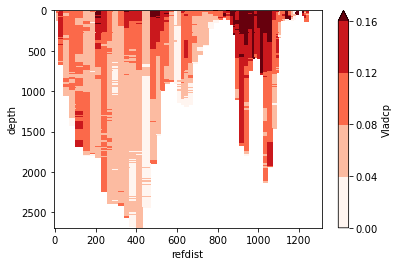

In [21]:
Vladcpstd.plot(y='depth', yincrease=False, levels=np.arange(0, 0.18, 0.04), cmap=plt.cm.Reds)

## 2. Section plots

Create list of namedtuples for variable to plot on the figure with several subpanels:
The rows of the figure correspond to variable (Temperature, Salinity, Density, Velocity) while the columns correspond to the mean and standard deviation


In [22]:
import collections
fields = [
    'xarray_var',
    'short_name',
    'var_type',
    'contourf_lvls',
    'contour_lvls',    
    'cmap',
    'long_name',
    'cbar_title',
    ]
Datatoplot = collections.namedtuple('Datatoplot',fields,defaults=(None,) * len(fields))

In [23]:
Datatoplot?

Init signature:
Datatoplot(
    xarray_var=None,
    short_name=None,
    var_type=None,
    contourf_lvls=None,
    contour_lvls=None,
    cmap=None,
    long_name=None,
    cbar_title=None,
)
Docstring:      Datatoplot(xarray_var, short_name, var_type, contourf_lvls, contour_lvls, cmap, long_name, cbar_title)
Type:           type
Subclasses:     


##### Definitions of the list of variables to plot with plotting options

In [24]:

ptmp_mean = Datatoplot(xarray_var='ptmp', short_name='Mean Pot. Temp.', var_type='mean', 
                      contourf_lvls= np.arange(3, 11, 1),cmap='plasma', 
                      long_name = 'Mean Potential Temperature', cbar_title ='$^\circ$C')

ptmp_std = Datatoplot(xarray_var='ptmp', short_name='Std Pot. Temp.', var_type='std', 
                      contourf_lvls= np.arange(0, 1.2, 0.2),cmap='OrRd', 
                      long_name = 'Std Potential Temperature', cbar_title ='$^\circ$C')

psal_mean = Datatoplot(xarray_var='psal', short_name='Mean Sal.', var_type='mean', 
                      contourf_lvls= np.arange(34.9, 35.45, 0.05), cmap='viridis', 
                      long_name = 'Mean Salinity', cbar_title =' ')

psal_std = Datatoplot(xarray_var='psal', short_name='Std Sal.', var_type='std', 
                      contourf_lvls= np.arange(0, 0.12, 0.02),cmap='OrRd', 
                      long_name = 'Std Salinity', cbar_title =' ')

sigma0_mean = Datatoplot(xarray_var='sigma0', short_name='Mean Pot. Dens. Ano.', var_type='mean', 
                      contourf_lvls= np.arange(27.2, 27.9, 0.1), cmap='cividis_r', 
                      long_name = 'Mean Potential Density Anomaly', cbar_title ='kg.m$^{-3}$')

sigma0_std = Datatoplot(xarray_var='sigma0', short_name='Std Pot. Dens. Ano.', var_type='std', 
                      contourf_lvls= np.arange(0, 0.12, 0.02),cmap='OrRd', 
                      long_name = 'Std Potential Density Anomaly', cbar_title ='kg.m$^{-3}$')

sigma0_mean = Datatoplot(xarray_var='sigma0', short_name='Mean Pot. Dens. Ano.', var_type='mean', 
                      contourf_lvls= np.arange(27.2, 27.9, 0.1), cmap='cividis_r', 
                      long_name = 'Mean Potential Density Anomaly', cbar_title ='kg.m$^{-3}$')

sigma0_std = Datatoplot(xarray_var='sigma0', short_name='Std Pot. Dens. Ano.', var_type='std', 
                      contourf_lvls= np.arange(0, 0.12, 0.02),cmap='OrRd', 
                      long_name = 'Std Potential Density Anomaly', cbar_title ='kg.m$^{-3}$')

ladcp_mean = Datatoplot(xarray_var='Vladcp', short_name='Mean LADCP Vel.', var_type='mean', 
                      contourf_lvls= np.arange(-16, 20, 4)/100, cmap='coolwarm', 
                      long_name = 'Mean cross-section velocity from LADCP', cbar_title ='m.s$^{-1}$')

ladcp_std = Datatoplot(xarray_var='Vladcp', short_name='Std LADCP Vel.', var_type='std', 
                      contourf_lvls= np.arange(0, 18, 4)/100, cmap='OrRd', 
                      long_name = 'Std cross-section velocity from LADCP', cbar_title ='m.s$^{-1}$')

# Create a list of namedtuples
varstoplot=((ptmp_mean,ptmp_std),
              (psal_mean,psal_std),
              (sigma0_mean,sigma0_std),
              (ladcp_mean,ladcp_std),            
           )

Definition of a class to display a "pretty" formatting of the namedtuples (from [stackoverflow post](https://stackoverflow.com/a/43823671/13890678)):

In [25]:
from io import StringIO
import pprint

class MyPrettyPrinter(pprint.PrettyPrinter):
    def format_namedtuple(self, object, stream, indent, allowance, context, level):
        # Code almost equal to _format_dict, see pprint code
        write = stream.write
        write(object.__class__.__name__ + '(')
        object_dict = object._asdict()
        length = len(object_dict)
        if length:
            # We first try to print inline, and if it is too large then we print it on multiple lines
            inline_stream = StringIO()
            self.format_namedtuple_items(object_dict.items(), inline_stream, indent, allowance + 1, context, level, inline=True)
            max_width = self._width - indent - allowance
            if len(inline_stream.getvalue()) > max_width:
                self.format_namedtuple_items(object_dict.items(), stream, indent, allowance + 1, context, level, inline=False)
            else:
                stream.write(inline_stream.getvalue())
        write(')')

    def format_namedtuple_items(self, items, stream, indent, allowance, context, level, inline=False):
        # Code almost equal to _format_dict_items, see pprint code
        indent += self._indent_per_level
        write = stream.write
        last_index = len(items) - 1
        if inline:
            delimnl = ', '
        else:
            delimnl = ',\n' + ' ' * indent
            write('\n' + ' ' * indent)
        for i, (key, ent) in enumerate(items):
            last = i == last_index
            write(key + '=')
            self._format(ent, stream, indent + len(key) + 2,
                         allowance if last else 1,
                         context, level)
            if not last:
                write(delimnl)

    def _format(self, object, stream, indent, allowance, context, level):
        # We dynamically add the types of our namedtuple and namedtuple like 
        # classes to the _dispatch object of pprint that maps classes to
        # formatting methods
        # We use a simple criteria (_asdict method) that allows us to use the
        # same formatting on other classes but a more precise one is possible
        if hasattr(object, '_asdict') and type(object).__repr__ not in self._dispatch:
            self._dispatch[type(object).__repr__] = MyPrettyPrinter.format_namedtuple
        super()._format(object, stream, indent, allowance, context, level)

In [26]:
pp = MyPrettyPrinter(indent=2, depth=4)
pp.pprint(varstoplot)

( ( Datatoplot(
      xarray_var='ptmp',
      short_name='Mean Pot. Temp.',
      var_type='mean',
      contourf_lvls=array([ 3,  4,  5,  6,  7,  8,  9, 10]),
      contour_lvls=None,
      cmap='plasma',
      long_name='Mean Potential Temperature',
      cbar_title='$^\\circ$C'),
    Datatoplot(
      xarray_var='ptmp',
      short_name='Std Pot. Temp.',
      var_type='std',
      contourf_lvls=array([0. , 0.2, 0.4, 0.6, 0.8, 1. ]),
      contour_lvls=None,
      cmap='OrRd',
      long_name='Std Potential Temperature',
      cbar_title='$^\\circ$C')),
  ( Datatoplot(
      xarray_var='psal',
      short_name='Mean Sal.',
      var_type='mean',
      contourf_lvls=array([34.9 , 34.95, 35.  , 35.05, 35.1 , 35.15, 35.2 , 35.25, 35.3 ,
       35.35, 35.4 , 35.45]),
      contour_lvls=None,
      cmap='viridis',
      long_name='Mean Salinity',
      cbar_title=' '),
    Datatoplot(
      xarray_var='psal',
      short_name='Std Sal.',
      var_type='std',
      contourf_lvls=array([

### 2.1 With Holoviews 
see more details here [https://hvplot.holoviz.org/reference/xarray/contourf.html#xarray-gallery-contourf]

In [27]:
import xarray as xr
import hvplot.xarray
import holoviews as hv

In [28]:
data = varstoplot[0][0]
if data.var_type == 'mean':
    xrdata = da.mean('year')
elif data.var_type == 'std':
    xrdata = da.std('year')   
else:
    raise ValueError(f"Wrong var_type in: {data}")

To "transform" the depth coordinate use the `transform` option (https://github.com/holoviz/hvplot/issues/497)

In [29]:
#hv.help(xrdata.hvplot.image())

#### 2.1.1 using image (NOT WORKING PROPERLY IF HORIZONTAL GRID IS NOT REGULAR)
<div class="alert alert-block alert-warning"> <b>Image method is only working for regular 2D grid</b>

In [30]:
hv_label = '°C'
reversedepth = - hv.dim('depth')
plot=xrdata.hvplot.image(x='refdist',y='depth',z=data.xarray_var,
                                    transforms=dict(depth=reversedepth),
                                    clim=(data.contourf_lvls.min(),data.contourf_lvls.max()),                  
                                    cmap=data.cmap,
                                    clabel=hv_label, 
                                    label=data.long_name)


plot

:Image   [refdist,depth]   (ptmp)


#### 2.1.2 using contour

In [31]:
hv_label = '°C'
reversedepth = - hv.dim('depth')
cont=xrdata.hvplot.contour(z=data.xarray_var, x='refdist', y='depth',
                                    transforms=dict(depth=reversedepth),
                                    levels=data.contourf_lvls,
                                    cmap=data.cmap,
                                    clabel=hv_label, 
                                    label=data.long_name)


cont

:Contours   [refdist,depth]   (ptmp)

#### 2.1.3 using contour

In [32]:
xrdata

<xarray.Dataset>
Dimensions:   (depth: 269, refdist: 69)
Coordinates:
  * refdist   (refdist) int64 0 13 25 55 84 122 ... 1277 1286 1292 1298 1307
  * depth     (depth) int64 5 15 25 35 45 55 ... 2635 2645 2655 2665 2675 2685
    Staname   (refdist) object 'IB23S' 'IB22S' 'IB21S' ... '3G' '2G' '1G'
    lon       (refdist) float64 -20.21 -20.07 -19.92 ... -6.367 -6.283 -6.133
    lat       (refdist) float64 63.32 63.22 63.13 62.92 ... 56.71 56.68 56.67
Data variables:
    ptmp      (refdist, depth) float64 nan nan nan nan nan ... nan nan nan nan
    psal      (refdist, depth) float64 nan nan nan nan nan ... nan nan nan nan
    sigma0    (refdist, depth) float64 nan nan nan nan nan ... nan nan nan nan
    Vrel      (refdist, depth) float64 nan nan nan nan nan ... nan nan nan nan
    Vladcp    (refdist, depth) float64 nan nan nan nan nan ... nan nan nan nan
    Vabs      (refdist, depth) float64 nan nan nan nan nan ... nan nan nan nan
    DepthSta  (refdist) float64 120.0 670.0 1.03e+03 1.4e+03 ... 70.0 30.0 190.0
    Month     float64 6.471

In [33]:
# Hover setup
from bokeh.models import HoverTool
MyHover = HoverTool(
    tooltips=[
        ( 'x', '@refdist'),
        ( 'y', '@depth'),
        ( 'ptmp', '@ptmp{%1.3f} degC'),
   ],
    formatters={
        '@x' : 'numeral',
        '@y' : 'numeral',
        '@ptmp' : 'printf',
    },
    point_policy="follow_mouse"
)


In [34]:
hv_label = '°C'
reversedepth = - hv.dim('depth')
contf=xrdata.hvplot.contourf(z=data.xarray_var, x='refdist', y='depth',
                                    transforms=dict(depth=reversedepth),
                                    levels=data.contourf_lvls,
                                    cmap=data.cmap,
                                    clabel=hv_label, 
                                    label=data.long_name,
                             )


contf.opts(tools = [MyHover])

:Polygons   [refdist,depth]   (ptmp)

In [35]:
#hv.help(xrdata.hvplot.contourf)


#### 2.1.3 Create overlay layers

More information on how to overlay plots [[here]](http://holoviews.org/user_guide/Composing_Elements.html)

##### Bathymetry section:

In [36]:
X  = dfs['Refdist']
Y  = -dfs['DepthSta']
Y2 = -2900*np.ones(Y.shape)
areaplot = hv.Area((X, Y, Y2), vdims=['y', 'y2'])

In [37]:
# Disbale the depreciationwarning from numpy :
# "VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences 
# (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) 
# is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray)""
np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)     

In [38]:
areaplot

:Area   [x]   (y,y2)


##### Station locations:

In [39]:
# Add vertical lines correpsonding to stations location
loc = [(x, -1500, 1520) for x in dfs['Refdist']]
vlines = hv.ErrorBars(loc)


#### 2.1.4 Merge overlay layers

In [40]:
# Overlay both plots
overlay_section = (areaplot * contf * vlines)

overlay_section.opts(
    hv.opts.Area(fill_color='saddlebrown'),
    hv.opts.ErrorBars(color='grey', line_width=1, lower_head=None,upper_head=None),
)

overlay_section.opts(ylim=(-3000, 10))

#hv.help(overlay_section.opts())

:Overlay
   .Area.I                              :Area   [x]   (y,y2)
   .Polygons.Mean_Potential_Temperature :Polygons   [refdist,depth]   (ptmp)
   .ErrorBars.I                         :ErrorBars   [x]   (y,yerror)


#### 2.1.5 Save object as html file

In [41]:
from bokeh.resources import INLINE
from bokeh.models import HoverTool

# hvplot.save(overlay_section, 'test_overlay_section.html', resources=INLINE)

In [42]:
Datatoplot??


Init signature:
Datatoplot(
    xarray_var=None,
    short_name=None,
    var_type=None,
    contourf_lvls=None,
    contour_lvls=None,
    cmap=None,
    long_name=None,
    cbar_title=None,
)
Docstring:      Datatoplot(xarray_var, short_name, var_type, contourf_lvls, contour_lvls, cmap, long_name, cbar_title)
Type:           type
Subclasses:     


### 2.2 With HoloViz Panel 
see more details here [https://panel.holoviz.org/gallery/index.html]
and dedicated notebook

In [43]:
# ptmp plots
ptmp_mean = Datatoplot(xarray_var='ptmp', short_name='Mean Pot. Temp.', var_type='mean', 
                      contourf_lvls= np.arange(3, 11, 1),cmap='plasma', 
                      long_name = 'Mean Potential Temperature', cbar_title ='°C')

ptmp_std = Datatoplot(xarray_var='ptmp', short_name='Std Pot. Temp.', var_type='std', 
                      contourf_lvls= np.arange(0, 1.2, 0.2),cmap='OrRd', 
                      long_name = 'Std Potential Temperature', cbar_title ='°C')

ptmp_count = Datatoplot(xarray_var='ptmp', short_name='Count Pot. Temp.', var_type='count', 
                      contourf_lvls= np.arange(-0.5, 16.5, 1),cmap='tab20', 
                      long_name = 'Count Potential Temperature', cbar_title ='')

ptmp_SE = Datatoplot(xarray_var='ptmp', short_name='SE Pot. Temp.', var_type='SE', 
                      contourf_lvls= ptmp_std.contourf_lvls/2,cmap='OrRd', 
                      long_name = 'Standard Error Potential Temperature', cbar_title ='°C')

# psal plots
psal_mean = Datatoplot(xarray_var='psal', short_name='Mean Sal.', var_type='mean', 
                      contourf_lvls= np.arange(34.9, 35.45, 0.05), cmap='viridis', 
                      long_name = 'Mean Salinity', cbar_title =' ')

psal_std = Datatoplot(xarray_var='psal', short_name='Std Sal.', var_type='std', 
                      contourf_lvls= np.arange(0, 0.12, 0.02),cmap='OrRd', 
                      long_name = 'Std Salinity', cbar_title =' ')

psal_count = Datatoplot(xarray_var='psal', short_name='Count Sal.', var_type='count', 
                      contourf_lvls= np.arange(-0.5, 16.5, 1),cmap='tab20', 
                      long_name = 'Count Salinity', cbar_title ='')

psal_SE = Datatoplot(xarray_var='psal', short_name='SE Sal.', var_type='SE', 
                      contourf_lvls= psal_std.contourf_lvls/2,cmap='OrRd', 
                      long_name = 'Standard Error Salinity', cbar_title =' ')

# sigma0 plots
sigma0_mean = Datatoplot(xarray_var='sigma0', short_name='Mean Pot. Dens. Ano.', var_type='mean', 
                      contourf_lvls= np.arange(27.2, 27.9, 0.1), cmap='cividis_r', 
                      long_name = 'Mean Potential Density Anomaly', cbar_title ='kg.m⁻³')

sigma0_std = Datatoplot(xarray_var='sigma0', short_name='Std Pot. Dens. Ano.', var_type='std', 
                      contourf_lvls= np.arange(0, 0.12, 0.02),cmap='OrRd', 
                      long_name = 'Std Potential Density Anomaly', cbar_title ='kg.m⁻³')

sigma0_count = Datatoplot(xarray_var='sigma0', short_name='Count Pot. Dens. Ano.', var_type='count', 
                      contourf_lvls= np.arange(-0.5, 16.5, 1),cmap='tab20', 
                      long_name = 'Count Potential Density Anomaly', cbar_title ='')

sigma0_SE = Datatoplot(xarray_var='sigma0', short_name='SE Pot. Dens. Ano.', var_type='SE', 
                      contourf_lvls= sigma0_std.contourf_lvls/2,cmap='OrRd', 
                      long_name = 'Standard Error Potential Density Anomaly', cbar_title ='kg.m⁻³')

# ladcp plots
ladcp_mean = Datatoplot(xarray_var='Vladcp', short_name='Mean LADCP Vel.', var_type='mean', 
                      contourf_lvls= np.arange(-16, 20, 4)/100, cmap='coolwarm', 
                      long_name = 'Mean cross-section velocity from LADCP', cbar_title ='m.s⁻¹')

ladcp_std = Datatoplot(xarray_var='Vladcp', short_name='Std LADCP Vel.', var_type='std', 
                      contourf_lvls= np.arange(0, 18, 4)/100, cmap='OrRd', 
                      long_name = 'Std cross-section velocity from LADCP', cbar_title ='m.s⁻¹')

ladcp_count = Datatoplot(xarray_var='Vladcp', short_name='Count LADCP Vel.', var_type='count', 
                      contourf_lvls= np.arange(-0.5, 16.5, 1),cmap='tab20', 
                      long_name = 'Count cross-section velocity from LADCP', cbar_title ='')

ladcp_SE = Datatoplot(xarray_var='Vladcp', short_name='SE LADCP Vel.', var_type='SE', 
                      contourf_lvls= ladcp_std.contourf_lvls/2, cmap='OrRd', 
                      long_name = 'Standard Error cross-section velocity from LADCP', cbar_title ='m.s⁻¹')


# # Create a list of namedtuples
# varstoplot=((ptmp_mean,ptmp_std),
#               (psal_mean,psal_std),
#               (sigma0_mean,sigma0_std),
#               (ladcp_mean,ladcp_std),            
#            )

# Create a dictionnary of namedtuples
vars_dict = { 'ptmp': {'mean': ptmp_mean, 'std':ptmp_std, 'count':ptmp_count, 'SE':ptmp_SE},
              'psal': {'mean': psal_mean, 'std':psal_std, 'count':psal_count, 'SE':psal_SE},
              'sigma0': {'mean': sigma0_mean, 'std':sigma0_std, 'count':sigma0_count, 'SE':sigma0_SE},
              'Vladcp': {'mean': ladcp_mean, 'std':ladcp_std, 'count':ladcp_count, 'SE':ladcp_SE},          
            }

In [44]:
data_nametuple = vars_dict['ptmp']['mean']

In [45]:
da

<xarray.Dataset>
Dimensions:   (depth: 269, refdist: 69, year: 17)
Coordinates:
  * refdist   (refdist) int64 0 13 25 55 84 122 ... 1277 1286 1292 1298 1307
  * year      (year) int64 1996 1997 1998 1999 2000 ... 2013 2014 2015 2016 2017
  * depth     (depth) int64 5 15 25 35 45 55 ... 2635 2645 2655 2665 2675 2685
    Staname   (refdist) object 'IB23S' 'IB22S' 'IB21S' ... '3G' '2G' '1G'
    lon       (refdist) float64 -20.21 -20.07 -19.92 ... -6.367 -6.283 -6.133
    lat       (refdist) float64 63.32 63.22 63.13 62.92 ... 56.71 56.68 56.67
Data variables:
    ptmp      (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    psal      (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    sigma0    (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    Vrel      (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    Vladcp    (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    Vabs      (refdist, year, depth) float64 nan nan nan nan ... nan nan nan nan
    DepthSta  (refdist) int64 120 670 1030 1400 1670 1790 ... 80 115 70 30 190
    CruiseID  (year) object 'd22396' 'd23097' 'd23398' ... 'dy052' 'dy078'
    Month     (year) int64 10 9 5 9 2 2 10 10 8 6 5 5 5 7 6 6 5

In [46]:
xrdata = da.count('year')
xrdata['ptmp']

<xarray.DataArray 'ptmp' (refdist: 69, depth: 269)>
array([[0, 0, 0, ..., 0, 0, 0],
       [1, 8, 8, ..., 0, 0, 0],
       [1, 8, 9, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])
Coordinates:
  * refdist  (refdist) int64 0 13 25 55 84 122 ... 1268 1277 1286 1292 1298 1307
  * depth    (depth) int64 5 15 25 35 45 55 65 ... 2635 2645 2655 2665 2675 2685
    Staname  (refdist) object 'IB23S' 'IB22S' 'IB21S' 'IB20S' ... '3G' '2G' '1G'
    lon      (refdist) float64 -20.21 -20.07 -19.92 ... -6.367 -6.283 -6.133
    lat      (refdist) float64 63.32 63.22 63.13 62.92 ... 56.71 56.68 56.67

In [47]:
xrdata.hvplot.contourf(z='ptmp', x='refdist', y='depth',
                                    levels=np.arange(0.5, 16.5, 1),
                                    transforms=dict(depth=reversedepth),
                      )

:Polygons   [refdist,depth]   (ptmp)

Useful guide about hover formatting here: https://docs.bokeh.org/en/latest/docs/user_guide/tools.html#formatting-tooltip-fields


For tale of unicode character, go there: https://en.wikipedia.org/wiki/List_of_Unicode_characters#Superscripts_and_Subscripts

In [48]:
def plot_section(var_name, stats_type='mean', ds=da,  df_metadata=dfs):
    """
    Filled contour plot of the mean or standard deviation EEL section.

    Arguments
    ---------
    var_name: string
        Choose between ptmp, psal, sigma0, Vladcp
    stats_type: string
        Choose between mean, std, count, or SE
    ds: A X-array DataSet with coordinates (depth, distance, year)
    df_metadata: a dataframe
        Contains the metadata about the station location and water depth 
        for overlay plots.
    Returns
    -------
    obj : HoloViews object
        The HoloViews representation of the plot.
    """
    
    data_nametuple = vars_dict[var_name][stats_type]
    if data_nametuple.var_type == 'mean':
        xrdata = ds.mean('year')
    elif data_nametuple.var_type == 'std':
        xrdata = ds.std('year')   
    elif data_nametuple.var_type == 'count':
        xrdata = ds.count('year')         
    elif data_nametuple.var_type == 'SE':
        xrdata = ds.std('year') / np.sqrt(ds.count('year'))                   
    else:
        raise ValueError(f"Wrong var_type in: {data_nametuple}")
        
    # plot contourf
    reversedepth = - hv.dim('depth')
    contf=xrdata.hvplot.contourf(z=data_nametuple.xarray_var, x='refdist', y='depth',
                                        transforms=dict(depth=reversedepth),
                                        levels=data_nametuple.contourf_lvls,
                                        cmap=data_nametuple.cmap,
                                        clabel=data_nametuple.cbar_title, 
                                        label=data_nametuple.long_name,
                                        )

    MyHover = HoverTool(
        tooltips=[
#             ( 'x', '@refdist'),
#             ( 'y', '@depth'),
            ( data_nametuple.short_name, '@' + data_nametuple.xarray_var + '{%2.3f} ' + data_nametuple.cbar_title),
       ],
        formatters={
            '@x' : 'numeral',
            '@y' : 'numeral',
            '@' + data_nametuple.xarray_var : 'printf',
        },
        point_policy="follow_mouse"
    )
    
    contf.opts(tools = [MyHover])
    
    # add bathymetry
    X  = df_metadata['Refdist']
    Y  = -df_metadata['DepthSta']
    Y2 = -2900*np.ones(Y.shape)
    areaplot = hv.Area((X, Y, Y2), vdims=['y', 'y2'])

    # Add vertical lines correpsonding to stations location
    loc = [(x, -1500, 1520) for x in df_metadata['Refdist']]
    vlines = hv.ErrorBars(loc)
    
    # Overlay both plots
    overlay_section = (areaplot * contf * vlines)

    overlay_section.opts(
        hv.opts.Area(fill_color='saddlebrown'),
        hv.opts.ErrorBars(color='grey', line_width=1, lower_head=None,upper_head=None),
    )

    overlay_section.opts(ylim=(-3000, 10))

    return overlay_section

In [49]:
#hvplot.help('contourf')

In [50]:
plot_section('Vladcp',stats_type='mean')

:Overlay
   .Area.I                                                       :Area   [x]   (y,y2)
   .Polygons.Mean_cross_hyphen_minus_section_velocity_from_LADCP :Polygons   [refdist,depth]   (Vladcp)
   .ErrorBars.I                                                  :ErrorBars   [x]   (y,yerror)

In [51]:
plot_section('Vladcp',stats_type='std')

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py

:Overlay
   .Area.I                                                      :Area   [x]   (y,y2)
   .Polygons.Std_cross_hyphen_minus_section_velocity_from_LADCP :Polygons   [refdist,depth]   (Vladcp)
   .ErrorBars.I                                                 :ErrorBars   [x]   (y,yerror)

In [52]:
plot_section('Vladcp',stats_type='count')

:Overlay
   .Area.I                                                        :Area   [x]   (y,y2)
   .Polygons.Count_cross_hyphen_minus_section_velocity_from_LADCP :Polygons   [refdist,depth]   (Vladcp)
   .ErrorBars.I                                                   :ErrorBars   [x]   (y,yerror)

In [53]:
plot_section('Vladcp',stats_type='SE')

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py

:Overlay
   .Area.I                                                                 :Area   [x]   (y,y2)
   .Polygons.Standard_Error_cross_hyphen_minus_section_velocity_from_LADCP :Polygons   [refdist,depth]   (Vladcp)
   .ErrorBars.I                                                            :ErrorBars   [x]   (y,yerror)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
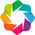

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py

Column
    [0] Column
        [0] Markdown(str)
        [1] RadioButtonGroup(name='Variable', options=['ptmp', 'psal', ...], value='ptmp')
    [1] Column
        [0] ParamFunction(function)
        [1] ParamFunction(function)
        [2] ParamFunction(function)
        [3] ParamFunction(function)

In [54]:
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')

import panel as pn
import panel.widgets as pnw
pn.extension()


variable_type = ('ptmp', 'psal', 'sigma0','Vladcp')

variables  = pnw.RadioButtonGroup(name='Variable', value='ptmp', 
                                 options=list(variable_type))

@pn.depends(variables)
def reactive_mean_section(variables):
    return plot_section(variables)

@pn.depends(variables)
def reactive_std_section(variables):
    return plot_section(variables, stats_type='std')

@pn.depends(variables)
def reactive_count_section(variables):
    return plot_section(variables, stats_type='count')

@pn.depends(variables)
def reactive_SE_section(variables):
    return plot_section(variables, stats_type='SE')

widgets   = pn.Column("<br>\n# Statistics", variables)

# The widget buttons don't work when plotting mean section on top of std section
section_pn = pn.Column(widgets,pn.Column(reactive_mean_section,
                                         reactive_std_section,
                                         reactive_count_section,
                                         reactive_SE_section,)
                      )

#section_pn.show()
section_pn

#### Export hv object into html file

More info about export panel object can be found here: https://panel.holoviz.org/user_guide/Deploy_and_Export.html

In [58]:
# Export into static html file: 
htmldir = 'html/'
section_pn.save(htmldir + '02_section_panel_mean_std_SE.html', embed=True)

# # It doesnt work when std and mean are part of the same panels. So export them separately:
# pn.Column(widgets,reactive_mean_section).save(htmldir + '02_section_panel_mean.html', embed=True)
# pn.Column(widgets,reactive_std_section).save(htmldir + '02_section_panel_std.html', embed=True)
# pn.Column(widgets,reactive_count_section).save(htmldir + '02_section_panel_count.html', embed=True)
# pn.Column(widgets,reactive_SE_section).save(htmldir + '02_section_panel_SE.html', embed=True)

  0%|          | 0/4 [00:00<?, ?it/s]

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py

 25%|██▌       | 1/4 [00:03<00:11,  3.90s/it]

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py

 50%|█████     | 2/4 [00:07<00:07,  3.85s/it]

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py

 75%|███████▌  | 3/4 [00:11<00:03,  3.67s/it]

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py

### 2nd version of the panel

In [56]:

variable_type = ('ptmp', 'psal', 'sigma0','Vladcp')

variables  = pnw.Select(name='Variable', value='ptmp', 
                                 options=list(variable_type))

stats_type = ('mean', 'std', 'count','SE')

stats  = pnw.RadioButtonGroup(name='Statistic', value='mean', 
                                 options=list(stats_type))

@pn.depends(variables,stats)
def reactive_section(variables,stats):
    return plot_section(variables, stats_type=stats)

widgets   = pn.Column("<br>\n# Statistics", variables,stats)

# The widget buttons don't work when plotting mean section on top of std section
section_pn2 = pn.Column(widgets,reactive_section
                      )

#section_pn.show()
section_pn2

Column
    [0] Column
        [0] Markdown(str)
        [1] Select(name='Variable', options=['ptmp', 'psal', ...], value='ptmp')
        [2] RadioButtonGroup(name='Statistic', options=['mean', 'std', ...], value='mean')
    [1] ParamFunction(function)

In [57]:
# Export into static html file: 
section_pn2.save(htmldir + '02_section_panel_double_selector.html', embed=True)


  0%|          | 0/16 [00:00<?, ?it/s]

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py

 12%|█▎        | 2/16 [00:01<00:07,  1.81it/s]

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py

 25%|██▌       | 4/16 [00:01<00:05,  2.24it/s]

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py

 38%|███▊      | 6/16 [00:03<00:05,  1.77it/s]

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py

 50%|█████     | 8/16 [00:04<00:03,  2.17it/s]

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py

 62%|██████▎   | 10/16 [00:05<00:03,  1.96it/s]

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py

 75%|███████▌  | 12/16 [00:05<00:01,  2.32it/s]

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py

 88%|████████▊ | 14/16 [00:07<00:01,  1.90it/s]

/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/locupe/opt/anaconda3/envs/analysis_eel_data/lib/python3.9/site-packages/numpy/lib/nanfunctions.py